<a href="https://colab.research.google.com/github/plaban1981/Langchain_usecases/blob/main/Headless_ecommerce_chat_with_fashion_products_using_langchain_and_Qdrant.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -qU langchain openai transformers sentence-transformers datasets qdrant-client

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 809.1/809.1 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 223.7/223.7 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 31.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 8.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 24.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.7/203.7 kB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 44.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 26.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.2/46.2 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.0/75.0 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 47.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 13.8 MB/

In [2]:
!pip install protobuf==3.20.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 12.3 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.1
    Uninstalling protobuf-4.25.1:
      Successfully uninstalled protobuf-4.25.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-tools 1.60.0 requires protobuf<5.0dev,>=4.21.6, but you have protobuf 3.20.3 which is incompatible.


## Hybrid Search

Hybrid vector search is **combination of traditional keyword search and modern dense vector search**. It has emerged as a powerful tool for e-commerce companies looking to improve the search experience for their customers.

By combining the strengths of traditional text-based search algorithms with the visual recognition capabilities of deep learning models, hybrid vector search allows users to search for products using a combination of text and images. This can be especially useful for product searches, where customers may not know the exact name or details of the item they are looking for.

Pinecone's **sparse-dense** index allows to seamlessly perform hybrid search for e-commerce or in any other context.

## Import Required Libraries

In [1]:
import qdrant_client
from qdrant_client import QdrantClient
from langchain.vectorstores import Qdrant
from qdrant_client.http import models
from sentence_transformers import SentenceTransformer

## Download the Models

In [2]:
from transformers import AutoModelForMaskedLM, AutoTokenizer

doc_model_id = "naver/efficient-splade-VI-BT-large-doc"
doc_tokenizer = AutoTokenizer.from_pretrained(doc_model_id)
doc_model = AutoModelForMaskedLM.from_pretrained(doc_model_id)

query_model_id = "naver/efficient-splade-VI-BT-large-query"
query_tokenizer = AutoTokenizer.from_pretrained(query_model_id)
query_model = AutoModelForMaskedLM.from_pretrained(query_model_id)

tokenizer_config.json:   0%|          | 0.00/449 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/620 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/268M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/417 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/699 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/17.7M [00:00<?, ?B/s]

## Setup the Vectorstore

In [3]:
# Qdrant client setup
client = QdrantClient(":memory:")

# Define collection name
COLLECTION_NAME = "hybrid"

In [4]:
client.recreate_collection(
    collection_name=COLLECTION_NAME,
    vectors_config={
        "text-dense": models.VectorParams(
        size=512,  # Vector size is defined by used model
        distance=models.Distance.COSINE,
        )
    },
    sparse_vectors_config={
        "text-sparse": models.SparseVectorParams(
            index=models.SparseIndexParams(
                on_disk=False,
            )
        )
    },
)

True

## Load Dataset
We will work with a subset of the Open Fashion Product Images dataset, consisting of ~44K fashion products with images and category labels describing the products. The dataset can be loaded from the Huggigface Datasets hub as follows:

In [5]:
from datasets import load_dataset

# load the dataset from huggingface datasets hub
fashion = load_dataset(
    #"ashraq/fashion-product-images-small",
    "KrushiJethe/fashion_data",
    split="train"
)
fashion

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/9300 [00:00<?, ? examples/s]

Dataset({
    features: ['image', 'Unnamed: 0', 'articleType', 'productDisplayName', 'articleType_label'],
    num_rows: 9300
})

In [6]:
images = fashion["image"]
data = fashion.remove_columns("image")
product_df = data.to_pandas()
product_data = product_df.reset_index(drop=True).to_dict(orient="index")
print(product_data)

{0: {'Unnamed: 0': 7891, 'articleType': 'Track Pants', 'productDisplayName': 'Nike Men Grey Melange Track Pants', 'articleType_label': 26}, 1: {'Unnamed: 0': 7951, 'articleType': 'Track Pants', 'productDisplayName': "Nike Men's Breakli Navy Blue Track Pants", 'articleType_label': 26}, 2: {'Unnamed: 0': 8552, 'articleType': 'Tshirts', 'productDisplayName': 'Nike Men As Ss Cruiser Yellow T-Shirts', 'articleType_label': 28}, 3: {'Unnamed: 0': 1970, 'articleType': 'Dresses', 'productDisplayName': "Palm Tree Girl's Cr Blossom Drs Pink Dresses", 'articleType_label': 6}, 4: {'Unnamed: 0': 6486, 'articleType': 'Shorts', 'productDisplayName': 'Nike Men Black Three Quarter Track Pants', 'articleType_label': 21}, 5: {'Unnamed: 0': 7983, 'articleType': 'Track Pants', 'productDisplayName': 'Nike Women Regular Grey Track Pants', 'articleType_label': 26}, 6: {'Unnamed: 0': 6377, 'articleType': 'Shorts', 'productDisplayName': 'Puma Women Trunk Black Shorts', 'articleType_label': 21}, 7: {'Unnamed: 0':

In [7]:
product_data[0]

{'Unnamed: 0': 7891,
 'articleType': 'Track Pants',
 'productDisplayName': 'Nike Men Grey Melange Track Pants',
 'articleType_label': 26}

In [8]:
product_df.head()

,Unnamed: 0,articleType,productDisplayName,articleType_label
0,7891,Track Pants,Nike Men Grey Melange Track Pants,26
1,7951,Track Pants,Nike Men's Breakli Navy Blue Track Pants,26
2,8552,Tshirts,Nike Men As Ss Cruiser Yellow T-Shirts,28
3,1970,Dresses,Palm Tree Girl's Cr Blossom Drs Pink Dresses,6
4,6486,Shorts,Nike Men Black Three Quarter Track Pants,21


In [9]:
product_df = product_df.rename(columns={"Unnamed: 0": "Pid"})
product_df

,Pid,articleType,productDisplayName,articleType_label
0,7891,Track Pants,Nike Men Grey Melange Track Pants,26
1,7951,Track Pants,Nike Men's Breakli Navy Blue Track Pants,26
2,8552,Tshirts,Nike Men As Ss Cruiser Yellow T-Shirts,28
3,1970,Dresses,Palm Tree Girl's Cr Blossom Drs Pink Dresses,6
4,6486,Shorts,Nike Men Black Three Quarter Track Pants,21
...,...,...,...,...
9295,6357,Shorts,ADIDAS Men M Rsp Black Shorts,21
9296,8475,Tshirts,Nike Men Tnfl Crew Black T-Shirts,28
9297,7897,Track Pants,Nike Men Ad Breakline Black Track Pants,26
9298,8408,Tshirts,Nike Men Laced Crew Yellow T-Shirts,28


In [10]:
product_df.shape

(9300, 4)

In [11]:
len(images)

9300

In [12]:
images[:3]

[<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>]

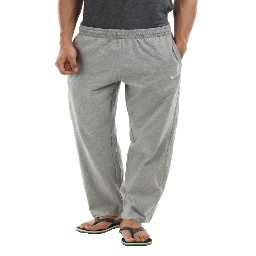

In [13]:
images[0]

* We need both sparse and dense vectors to perform hybrid search.
* We will use all the fields from product dataframe except for the **id** and **year** to create **sparse vectors** and the **product images** to create **dense vectors.**

## Sparse Vectors
To create the sparse vectors we'll use BM25. We import the BM25 function from the pinecone-text library.

In [14]:
import torch


def compute_vector(text, tokenizer, sparse_model):
    """
    Computes a vector from logits and attention mask using ReLU, log, and max operations.
    """
    tokens = tokenizer(text, return_tensors="pt")
    output = sparse_model(**tokens)
    logits, attention_mask = output.logits, tokens.attention_mask
    relu_log = torch.log(1 + torch.relu(logits))
    weighted_log = relu_log * attention_mask.unsqueeze(-1)
    max_val, _ = torch.max(weighted_log, dim=1)
    vec = max_val.squeeze()

    return vec, tokens




In [15]:
product_df['productDisplayName'][0]

'Nike Men Grey Melange Track Pants'

##checking the vector representation
*  productdisplay name: Turtle Check Men Navy Blue Shirt

In [16]:
vec, tokens = compute_vector(product_df['productDisplayName'][0],doc_tokenizer,doc_model)
print(vec.shape)

torch.Size([30522])


In [17]:
tokens

{'input_ids': tensor([[  101, 18368,  2273,  4462, 11463, 22043,  2650,  6471,   102]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1]])}

In [18]:
type(vec.tolist())

list

In [19]:
def extract_and_map_sparse_vector(vector, tokenizer):
    """
    Extracts non-zero elements from a given vector and maps these elements to their human-readable tokens using a tokenizer. The function creates and returns a sorted dictionary where keys are the tokens corresponding to non-zero elements in the vector, and values are the weights of these elements, sorted in descending order of weights.

    This function is useful in NLP tasks where you need to understand the significance of different tokens based on a model's output vector. It first identifies non-zero values in the vector, maps them to tokens, and sorts them by weight for better interpretability.

    Args:
    vector (torch.Tensor): A PyTorch tensor from which to extract non-zero elements.
    tokenizer: The tokenizer used for tokenization in the model, providing the mapping from tokens to indices.

    Returns:
    dict: A sorted dictionary mapping human-readable tokens to their corresponding non-zero weights.
    """

    # Extract indices and values of non-zero elements in the vector
    cols = vector.nonzero().squeeze().cpu().tolist()
    weights = vector[cols].cpu().tolist()

    # Map indices to tokens and create a dictionary
    idx2token = {idx: token for token, idx in tokenizer.get_vocab().items()}
    token_weight_dict = {
        idx2token[idx]: round(weight, 2) for idx, weight in zip(cols, weights)
    }

    # Sort the dictionary by weights in descending order
    sorted_token_weight_dict = {
        k: v
        for k, v in sorted(
            token_weight_dict.items(), key=lambda item: item[1], reverse=True
        )
    }

    return sorted_token_weight_dict


# Usage example
sorted_tokens = extract_and_map_sparse_vector(vec, doc_tokenizer)
sorted_tokens

{'nike': 2.58,
 'grey': 2.13,
 'pants': 1.98,
 'gray': 1.91,
 'track': 1.87,
 'tracks': 1.5,
 'men': 1.46,
 'wear': 1.46,
 'shoes': 1.45,
 '##ange': 1.42,
 'boots': 1.33,
 'mel': 1.33,
 'color': 1.31,
 'jeans': 1.28,
 'tracking': 1.24,
 'tracked': 1.07,
 'colors': 1.03,
 'shoe': 1.03,
 'clothes': 1.02,
 'clothing': 0.96,
 'brand': 0.88,
 'trousers': 0.78,
 '##wear': 0.78,
 'brands': 0.77,
 'pair': 0.71,
 'shorts': 0.7,
 'wearing': 0.67,
 'fit': 0.65,
 'sport': 0.63,
 'fabrics': 0.58,
 'bottoms': 0.57,
 'male': 0.54,
 'colour': 0.53,
 'dress': 0.49,
 'jean': 0.48,
 'worn': 0.47,
 'boot': 0.47,
 'runners': 0.46,
 'leather': 0.43,
 'sports': 0.42,
 'athletic': 0.41,
 'outfit': 0.39,
 'sneak': 0.39,
 'man': 0.37,
 'types': 0.34,
 'fits': 0.33,
 'fabric': 0.32,
 'watches': 0.32,
 'shirts': 0.27,
 'dresses': 0.27,
 'uniform': 0.26,
 'women': 0.25,
 'guys': 0.22,
 'matching': 0.21,
 'spikes': 0.2,
 'wore': 0.18,
 '##mel': 0.18,
 'jacket': 0.13,
 'wears': 0.13,
 'apparel': 0.1,
 'winged': 0.08

*  for the stored docs, we only need the "IDF" part:

## Gnerate the Sparse embeddings

In [20]:
from tqdm import tqdm
final_embeddings = []
indices  = []
values = []
for item in tqdm(product_df['productDisplayName'].values.tolist()):
  query_vec, tokens = compute_vector(item,doc_tokenizer,doc_model)
  query_indices = query_vec.nonzero().numpy().flatten()
  query_values = query_vec.detach().numpy()[query_indices]
  indices.append(query_indices)
  values.append(query_values)
  #final_embeddings.append(vec.tolist())

100%|██████████| 9300/9300 [03:45<00:00, 41.21it/s]


In [21]:
import numpy as np
np.save("query_indices", np.array(query_indices), allow_pickle=False)
np.save("query_values", np.array(query_values), allow_pickle=False)

## Generate metada information

In [22]:
payload = []
for i in range(product_df.shape[0]):
    payload.append({"image_id" :product_df.iloc[i]['Pid'],
                    "name":product_df.iloc[i]['productDisplayName']})

ids = list(range(product_df.shape[0]))

# embeddings = np.load("vectors.npy").tolist()

In [23]:
payload[0]

{'image_id': 7891, 'name': 'Nike Men Grey Melange Track Pants'}

In [24]:
len(indices)

9300

## Insert Sparse vectors into the vectorstore

In [25]:
import uuid
for i in tqdm(range(0, product_df.shape[0])):
    client.upsert(
    collection_name=COLLECTION_NAME,
    points=[models.PointStruct(
            id=i,
            payload=payload[i],  # Add any additional payload if necessary
            vector={
                "text-sparse": models.SparseVector(indices=indices[i].tolist(), values=values[i].tolist())
                },)
            ],
        )

100%|██████████| 9300/9300 [00:22<00:00, 408.34it/s]


## Check if the update is successful

In [26]:
#check if the update is successful
client.count(
    collection_name=COLLECTION_NAME,
    exact=True,
)

CountResult(count=9300)

## To visually inspect the collection we just created, we can scroll through our vectors with the client.scroll() method.

In [27]:
client.scroll(
    collection_name=COLLECTION_NAME,
    limit=10
)

([Record(id=0, payload={'image_id': 7891, 'name': 'Nike Men Grey Melange Track Pants'}, vector=None, shard_key=None),
  Record(id=1, payload={'image_id': 7951, 'name': "Nike Men's Breakli Navy Blue Track Pants"}, vector=None, shard_key=None),
  Record(id=2, payload={'image_id': 8552, 'name': 'Nike Men As Ss Cruiser Yellow T-Shirts'}, vector=None, shard_key=None),
  Record(id=3, payload={'image_id': 1970, 'name': "Palm Tree Girl's Cr Blossom Drs Pink Dresses"}, vector=None, shard_key=None),
  Record(id=4, payload={'image_id': 6486, 'name': 'Nike Men Black Three Quarter Track Pants'}, vector=None, shard_key=None),
  Record(id=5, payload={'image_id': 7983, 'name': 'Nike Women Regular Grey Track Pants'}, vector=None, shard_key=None),
  Record(id=6, payload={'image_id': 6377, 'name': 'Puma Women Trunk Black Shorts'}, vector=None, shard_key=None),
  Record(id=7, payload={'image_id': 6976, 'name': 'Reebok Men Speed Mode White Sports Shoes'}, vector=None, shard_key=None),
  Record(id=8, payloa

## Querying with Sparse Vectors

In [28]:
query_text = "Nike Track Pants"
query_vec, query_tokens = compute_vector(query_text,query_tokenizer,query_model)
query_vec.shape

query_indices = query_vec.nonzero().numpy().flatten()
query_values = query_vec.detach().numpy()[query_indices]

In [29]:
# Searching for similar documents
result = client.search(
    collection_name=COLLECTION_NAME,
    query_vector=models.NamedSparseVector(
        name="text-sparse",
        vector=models.SparseVector(
            indices=query_indices.tolist(),
            values=query_values.tolist(),
        ),
    ),
    with_vectors=True,
    limit=5,
)

result

[ScoredPoint(id=5923, version=0, score=17.80742073059082, payload={'image_id': 7890, 'name': 'Nike Men Blue Track Pants'}, vector={'text-sparse': SparseVector(indices=[2040, 2158, 2273, 2308, 2374, 2630, 2650, 2770, 2806, 2998, 3162, 3287, 3345, 3609, 3744, 3767, 3797, 3940, 4147, 4253, 4364, 4368, 4377, 4435, 4906, 4929, 5078, 5132, 5188, 5898, 5929, 6007, 6087, 6120, 6247, 6312, 6375, 6471, 6598, 6798, 6879, 7190, 7576, 8258, 8313, 8877, 9132, 9573, 9612, 9639, 9651, 9817, 9844, 9880, 10516, 10818, 11018, 11037, 11220, 11344, 11408, 11651, 12197, 12808, 13583, 14154, 14236, 14462, 15292, 16142, 16689, 18368, 19547, 19938, 24196, 25123, 26278, 27080, 28233], values=[0.03558506816625595, 0.8338910341262817, 1.5737128257751465, 0.23317040503025055, 0.019789518788456917, 1.9717254638671875, 1.960167646408081, 0.2317730039358139, 0.10912550985813141, 0.5870469212532043, 1.5732370615005493, 0.7764777541160583, 0.2943805158138275, 1.866944432258606, 0.6262922883033752, 0.06257718801498413, 

In [30]:
for r in result:
  print(r.payload)
  print(r.score)

{'image_id': 7890, 'name': 'Nike Men Blue Track Pants'}
17.80742073059082
{'image_id': 7830, 'name': 'Nike Men Solid Off-White Track Pants'}
17.72273063659668
{'image_id': 7871, 'name': 'Nike Men Black Track Pants'}
17.683469772338867
{'image_id': 8043, 'name': 'Nike Men Black Track Pants'}
17.683469772338867
{'image_id': 7885, 'name': 'Nike Men Black Track Pants'}
17.683469772338867


## Dense Vectors
We will use the CLIP to generate dense vectors for product images. We can directly pass PIL images to CLIP as it can encode both images and texts. We can load CLIP like so:

In [31]:
from sentence_transformers import SentenceTransformer
import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"device : {device}")
# load a CLIP model from huggingface
dense_model = SentenceTransformer(
    'sentence-transformers/clip-ViT-B-32',
    device=device
)
dense_model

device : cuda


.gitattributes:   0%|          | 0.00/690 [00:00<?, ?B/s]

0_CLIPModel/config.json:   0%|          | 0.00/4.03k [00:00<?, ?B/s]

0_CLIPModel/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

0_CLIPModel/preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

0_CLIPModel/special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

0_CLIPModel/tokenizer_config.json:   0%|          | 0.00/604 [00:00<?, ?B/s]

0_CLIPModel/vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

README.md:   0%|          | 0.00/1.88k [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

modules.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

SentenceTransformer(
  (0): CLIPModel()
)

In [32]:
dense_vec = dense_model.encode([product_df['productDisplayName'][0]])
dense_vec.shape

(1, 512)

* he model gives us a 512 dimensional dense vector.

## Generate Dense embeddings

In [33]:
final_embeddings = []
indices  = []
values = []
for item in tqdm(product_df['productDisplayName'].values.tolist()):
  vec=dense_model.encode(item)
  final_embeddings.append(vec)

100%|██████████| 9300/9300 [01:59<00:00, 77.64it/s]


In [34]:
len(final_embeddings)

9300

In [35]:
type(final_embeddings[0])

numpy.ndarray

In [41]:
import numpy as np
np.array(final_embeddings[0]).reshape(1,-1).shape

(1, 512)

In [36]:
len(payload)

9300

In [37]:
payload[0]

{'image_id': 7891, 'name': 'Nike Men Grey Melange Track Pants'}

In [38]:
product_df.shape[0]

9300

## Load the dense embeddings into the vectorstore

In [39]:
for i in tqdm(range(0, product_df.shape[0])):
        client.upsert(
        collection_name=COLLECTION_NAME,
        points=[models.PointStruct(
            id=i+product_df.shape[0],
            payload=payload[i],  # Add any additional payload if necessary
            vector={"text-dense":final_embeddings[i].tolist()})
            ],
        )



100%|██████████| 9300/9300 [00:12<00:00, 756.68it/s]


In [40]:
#check if the update is successful
client.count(
    collection_name=COLLECTION_NAME,
    exact=True,
)

CountResult(count=18600)

In [41]:
client.count(
    collection_name=COLLECTION_NAME,
    exact=True,
)

CountResult(count=18600)

In [43]:
client.scroll(
    collection_name=COLLECTION_NAME,
)

([Record(id=0, payload={'image_id': 7891, 'name': 'Nike Men Grey Melange Track Pants'}, vector=None, shard_key=None),
  Record(id=1, payload={'image_id': 7951, 'name': "Nike Men's Breakli Navy Blue Track Pants"}, vector=None, shard_key=None),
  Record(id=2, payload={'image_id': 8552, 'name': 'Nike Men As Ss Cruiser Yellow T-Shirts'}, vector=None, shard_key=None),
  Record(id=3, payload={'image_id': 1970, 'name': "Palm Tree Girl's Cr Blossom Drs Pink Dresses"}, vector=None, shard_key=None),
  Record(id=4, payload={'image_id': 6486, 'name': 'Nike Men Black Three Quarter Track Pants'}, vector=None, shard_key=None),
  Record(id=5, payload={'image_id': 7983, 'name': 'Nike Women Regular Grey Track Pants'}, vector=None, shard_key=None),
  Record(id=6, payload={'image_id': 6377, 'name': 'Puma Women Trunk Black Shorts'}, vector=None, shard_key=None),
  Record(id=7, payload={'image_id': 6976, 'name': 'Reebok Men Speed Mode White Sports Shoes'}, vector=None, shard_key=None),
  Record(id=8, payloa

## Hybrid Search

In [44]:
dense_vec = dense_model.encode("Men Navy Blue Track pant")
dense_vec.shape

(512,)

In [45]:
query_text = "Men Navy Blue Track pant"
query_vec, query_tokens = compute_vector(query_text,query_tokenizer,query_model)
query_vec.shape

query_indices = query_vec.nonzero().numpy().flatten()
query_values = query_vec.detach().numpy()[query_indices]

In [46]:
payload[0]

{'image_id': 7891, 'name': 'Nike Men Grey Melange Track Pants'}

In [91]:
results  = client.search_batch(
    collection_name=COLLECTION_NAME,
     requests=[
        models.SearchRequest(
            vector=models.NamedVector(
                name="text-dense",
                vector=dense_vec.tolist(),
            ),
            limit=5,
        ),
        models.SearchRequest(
            vector=models.NamedSparseVector(
                name="text-sparse",
                vector=models.SparseVector(
                    indices=query_indices.tolist(),
                    values=query_values.tolist(),
                ),
            ),
            limit=5,
        ),
    ],
)

/usr/local/lib/python3.10/dist-packages/qdrant_client/local/distances.py:77: RuntimeWarning: invalid value encountered in divide
  vectors = vectors / np.linalg.norm(vectors, axis=1)[:, np.newaxis]


In [92]:
results

[[ScoredPoint(id=13149, version=0, score=0.9168046584685693, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=11805, version=0, score=0.9168046584685693, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=11795, version=0, score=0.9168046584685693, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=11792, version=0, score=0.9168046584685693, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=13156, version=0, score=0.913891623724719, payload=None, vector=None, shard_key=None)],
 [ScoredPoint(id=7326, version=0, score=22.63808250427246, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=1186, version=0, score=22.486665725708008, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=1134, version=0, score=22.01921272277832, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=1183, version=0, score=21.511140823364258, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=6241, version=0, score=21.21209144592285, pa

In [93]:
dense_match = []
sparse_match = []
productid = []
scores = []
for result in results[0]:
   dense_match.append(result.id)
   productid.append(result.id - 9300)
   scores.append(result.score)
for result in results[1]:
   sparse_match.append(result.id)
   productid.append(result.id)
   scores.append(result.score)

In [64]:
dense_match

[13149, 11805, 11795, 11792, 13156]

## Matching products from Hybrid Search


In [132]:
def get_image_ids(dense_match,sparse_match):
  image_ids = []
  product_ids = []
  for item in dense_match:
    pids= product_df.iloc[item - 9300]['Pid']
    product_ids.append(pids)
    img_id = product_df[product_df['Pid'] == pids].index.values[0]
    print(img_id)
    image_ids.append(images[img_id])
  for item in sparse_match:
    ids= product_df.iloc[item]['Pid']
    product_ids.append(ids)
    img_id = product_df[product_df['Pid'] == ids].index.values[0]
    image_ids.append(images[img_id])
  return image_ids,product_ids

In [130]:
imageids = get_image_ids(dense_match,sparse_match)

3856
2509
3849
2505
2492
2495
3002
7326
1186
1752
2283
3292
5920
1124
785


In [131]:
imageids

[<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256>,
 <PIL.Jpeg

In [55]:
product_df.iloc[7326]['Pid']

8061

In [56]:
product_df.iloc[7326]['productDisplayName']

"Nike Men's Perfect Navy Blue Track Pant"

In [65]:
product_df[product_df['Pid'] == 8061].index.values[0]

7326

In [55]:
product_df.iloc[13149 - 9300]

Pid                                           8060
articleType                            Track Pants
productDisplayName    Proline Men Navy Track Pants
articleType_label                               26
Name: 3849, dtype: object

In [71]:
product_df.iloc[13149 - 9300]['Pid']

8060

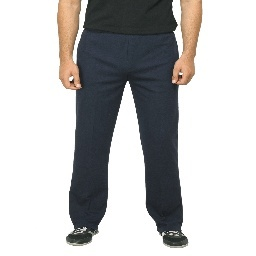

In [66]:
images[product_df[product_df['Pid'] == 8060].index.values[0]]

In [ ]:
query = "dark blue french connection jeans for men"
dense_vec = dense_model.encode(query)
query_vec, query_tokens = compute_vector(query)
query_indices = query_vec.nonzero().numpy().flatten()
query_values = query_vec.detach().numpy()[query_indices]

In [ ]:
results = client.search_batch(
    collection_name=COLLECTION_NAME,
     requests=[
        models.SearchRequest(
            vector=models.NamedVector(
                name="text-dense",
                vector=dense_vec.tolist(),
            ),
            limit=5,
        ),
        models.SearchRequest(
            vector=models.NamedSparseVector(
                name="text-sparse",
                vector=models.SparseVector(
                    indices=query_indices.tolist(),
                    values=query_values.tolist(),
                ),
            ),
            limit=5,
        ),
    ],
)

[[ScoredPoint(id=7885, version=0, score=0.9131513994484453, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=5371, version=0, score=0.9131513994484453, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=8133, version=0, score=0.9131513994484453, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=4653, version=0, score=0.8876761734536933, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=1662, version=0, score=0.8876761734536933, payload=None, vector=None, shard_key=None)],
 [ScoredPoint(id='ff0f8e5f-8c0c-405f-9dd1-d927d25f13eb', version=0, score=26.57835578918457, payload=None, vector=None, shard_key=None),
  ScoredPoint(id='9c7f3160-f9ef-46de-b4e8-46f629056230', version=0, score=26.57835578918457, payload=None, vector=None, shard_key=None),
  ScoredPoint(id='36441925-0eea-48b8-9113-93e24cc8dc48', version=0, score=23.589683532714844, payload=None, vector=None, shard_key=None),
  ScoredPoint(id='b87b448e-10a1-494d-a2c2-ba322385d77a', version=0,

In [ ]:
product_df.iloc[7885]

id                                                43489
gender                                              Men
masterCategory                                  Apparel
subCategory                                  Bottomwear
articleType                                       Jeans
baseColour                                        Black
season                                           Summer
year                                             2012.0
usage                                            Casual
productDisplayName    French Connection Men Black Jeans
Name: 7885, dtype: object

In [ ]:
product_df.iloc[5371]

id                                                48386
gender                                              Men
masterCategory                                  Apparel
subCategory                                  Bottomwear
articleType                                       Jeans
baseColour                                        Black
season                                           Summer
year                                             2012.0
usage                                            Casual
productDisplayName    French Connection Men Black Jeans
Name: 5371, dtype: object

In [60]:
results = client.search_batch(
    collection_name=COLLECTION_NAME,
     requests=[
        models.SearchRequest(
            vector=models.NamedVector(
                name="text-dense",
                vector=dense_vec.tolist(),
            ),
            limit=5,
        ),

    ],
)

/usr/local/lib/python3.10/dist-packages/qdrant_client/local/distances.py:77: RuntimeWarning: invalid value encountered in divide
  vectors = vectors / np.linalg.norm(vectors, axis=1)[:, np.newaxis]


In [61]:
results

[[ScoredPoint(id=13149, version=0, score=0.9168046584685693, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=11805, version=0, score=0.9168046584685693, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=11795, version=0, score=0.9168046584685693, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=11792, version=0, score=0.9168046584685693, payload=None, vector=None, shard_key=None),
  ScoredPoint(id=13156, version=0, score=0.913891623724719, payload=None, vector=None, shard_key=None)]]

## Create documents

In [59]:
product_df[product_df['Pid'] == 8061]

,Pid,articleType,productDisplayName,articleType_label
7326,8061,Track Pants,Nike Men's Perfect Navy Blue Track Pant,26


In [96]:
from langchain.schema import Document
def create_docs(pids,scores):
  docs = []
  for pid,score,in  zip(pids,scores):
    result_string = ""
    #
    product_name = product_df[product_df['Pid'] == pid][['productDisplayName']].values[0].tolist()[0]
    article = product_df[product_df['Pid'] == pid][["articleType"]].values[0].tolist()[0]
    #
    result_string += "Product Name:" +product_name+";" + "Article Type:"+article+";"
    doc = Document(page_content = result_string)
    doc.metadata['pid'] = str(pid)
    doc.metadata['score'] = score
    docs.append(doc)
  return docs

In [97]:
docs = create_docs(productid,scores)

In [98]:
docs

[Document(page_content='Product Name:Clarks Women Black Onslow Beat Leather Wedges;Article Type:Heels;', metadata={'pid': '3849', 'score': 0.9168046584685693}),
 Document(page_content='Product Name:Rocia Women Black Sandals;Article Type:Flats;', metadata={'pid': '2505', 'score': 0.9168046584685693}),
 Document(page_content='Product Name:Catwalk Women Brown Casual Sandals;Article Type:Flats;', metadata={'pid': '2495', 'score': 0.9168046584685693}),
 Document(page_content='Product Name:Carlton London Women Casual Black Sandals;Article Type:Flats;', metadata={'pid': '2492', 'score': 0.9168046584685693}),
 Document(page_content='Product Name:Catwalk Women Royalty Brown Flats;Article Type:Heels;', metadata={'pid': '3856', 'score': 0.913891623724719}),
 Document(page_content='Product Name:Celine Dion Women Grey Frame Sunglasses;Article Type:Sunglasses;', metadata={'pid': '7326', 'score': 22.63808250427246}),
 Document(page_content='Product Name:Heart 2 Heart Women Turquoise Blue Briefs H2H-6

## Helper function to display image

In [89]:
from IPython.core.display import HTML
from io import BytesIO
from base64 import b64encode

# function to display product images
def display_result(image_batch):
    figures = []
    for img in image_batch:
        b = BytesIO()
        img.save(b, format='png')
        figures.append(f'''
            <figure style="margin: 5px !important;">
              <img src="data:image/png;base64,{b64encode(b.getvalue()).decode('utf-8')}" style="width: 90px; height: 120px" >
            </figure>
        ''')
    return HTML(data=f'''
        <div style="display: flex; flex-flow: row wrap; text-align: center;">
        {''.join(figures)}
        </div>
    ''')


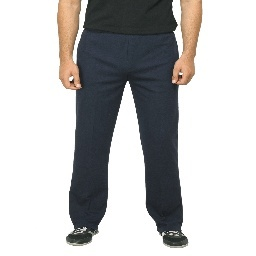
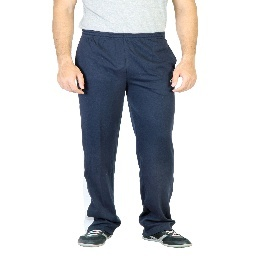
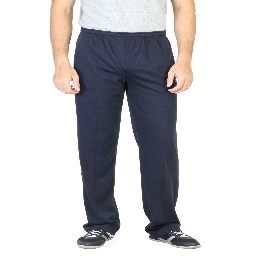
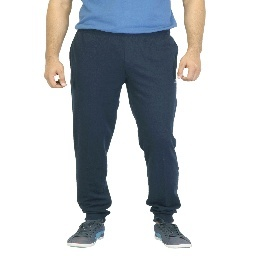
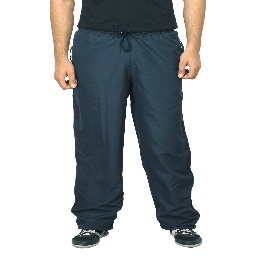
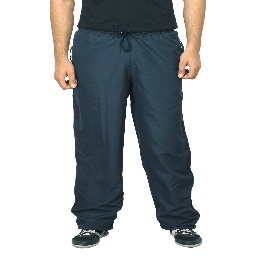
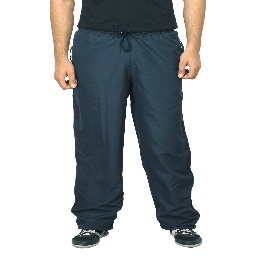
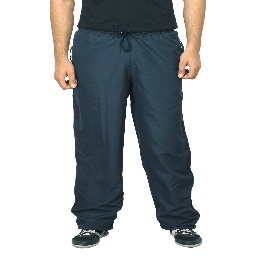
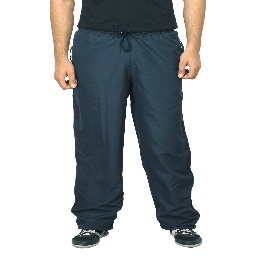
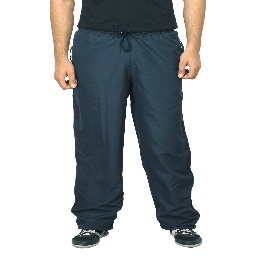

In [90]:
display_result(imageids)

## Helper function to print image details

In [ ]:
def print_images(results):
  for result in results:
    pid = result['id']
    print(product_df[pid]['productDisplayName'])
    display(images[pid])

## Generative Question-Answering

In [99]:
from langchain.chat_models import ChatOpenAI
from langchain.chains.question_answering import load_qa_chain
from langchain.prompts import PromptTemplate
from langchain.chains import RetrievalQA

In [111]:
import os
from getpass import getpass
os.environ["OPENAI_API_KEY"] = getpass()

··········


In [101]:
# completion llm
llm = ChatOpenAI(
    openai_api_key=os.environ["OPENAI_API_KEY"],
    model_name='gpt-3.5-turbo',
    temperature=0.0
)

## Vectorstore

In [117]:
def return_results(query_indices,query_values,dense_vec):
  results  = client.search_batch(
        collection_name=COLLECTION_NAME,
        requests=[
            models.SearchRequest(
                vector=models.NamedVector(
                    name="text-dense",
                    vector=dense_vec.tolist(),
                ),
                limit=15,
            ),
            models.SearchRequest(
                vector=models.NamedSparseVector(
                    name="text-sparse",
                    vector=models.SparseVector(
                        indices=query_indices.tolist(),
                        values=query_values.tolist(),
                    ),
                ),
                limit=15,
            ),
        ],
    )
  return results

## Perform Hybrid search on Question 1

/usr/local/lib/python3.10/dist-packages/qdrant_client/local/distances.py:77: RuntimeWarning: invalid value encountered in divide
  vectors = vectors / np.linalg.norm(vectors, axis=1)[:, np.newaxis]


3856
2509
3849
2505
2492
2495
3002
7326
1186
1752
2283
3292
5920
1124
785



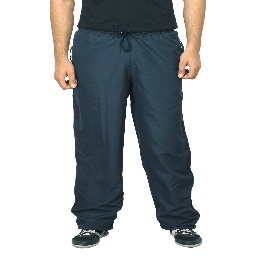
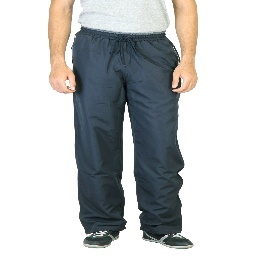
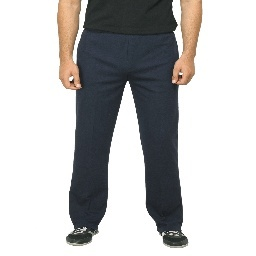
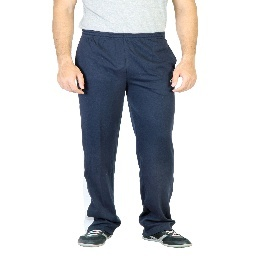
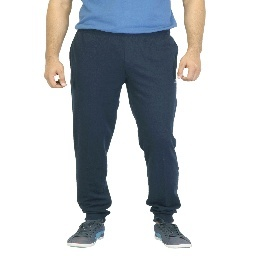
...
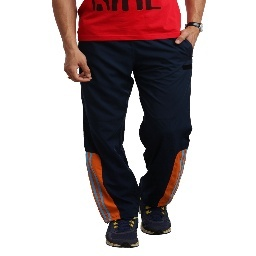
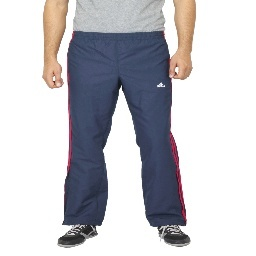
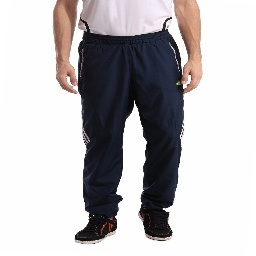
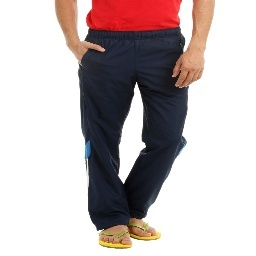
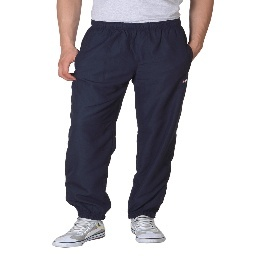

In [133]:
#
question = "Men's Perfect Navy Blue Track Pant"
#
dense_vec = dense_model.encode(question)
#
query_vec, query_tokens = compute_vector(question,query_tokenizer,query_model)
query_indices = query_vec.nonzero().numpy().flatten()
query_values = query_vec.detach().numpy()[query_indices]
#
results = return_results(query_indices,query_values,dense_vec)
#
dense_match = []
sparse_match = []

scores = []
for result in results[0]:
   dense_match.append(result.id)
   scores.append(result.score)
for result in results[1]:
   sparse_match.append(result.id)
   scores.append(result.score)
#
imageids,productids = get_image_ids(dense_match,sparse_match)
#create documents
docs = create_docs(productids,scores)
#
# used returned product ids to get images
display_result(imageids)

In [134]:
docs

[Document(page_content='Product Name:Proline Men Navy Blue Track Pants;Article Type:Track Pants;', metadata={'pid': '7974', 'score': 0.9200981272030726}),
 Document(page_content='Product Name:Proline Men  Navy Blue Track Pants;Article Type:Track Pants;', metadata={'pid': '7831', 'score': 0.9200981272030726}),
 Document(page_content='Product Name:Proline Men Navy Track Pants;Article Type:Track Pants;', metadata={'pid': '8060', 'score': 0.9180407343665666}),
 Document(page_content='Product Name:Proline Men Navy Track Pants;Article Type:Track Pants;', metadata={'pid': '7942', 'score': 0.9180407343665666}),
 Document(page_content='Product Name:Proline Men Navy Track Pants;Article Type:Track Pants;', metadata={'pid': '7915', 'score': 0.9180407343665666}),
 Document(page_content='Product Name:Proline Men Navy Track Pants;Article Type:Track Pants;', metadata={'pid': '8063', 'score': 0.9180407343665666}),
 Document(page_content='Product Name:Urban Yoga Men Navy Blue Track Pants;Article Type:Tr

## Feed results to a large language model

In [135]:
template = """
You are a fashion shopping assistant aiming to persuade customers using the provided information. Describe the season and usage mentioned in the context in your interaction with the customer.
Utilize a bullet list to detail each product for the customer.

Context : {context}
User question :{question}
Your Response:"""
#
prompt = PromptTemplate.from_template(template)


In [136]:
prompt

PromptTemplate(input_variables=['context', 'question'], template='\nYou are a fashion shopping assistant aiming to persuade customers using the provided information. Describe the season and usage mentioned in the context in your interaction with the customer.\nUtilize a bullet list to detail each product for the customer.\n\nContext : {context}\nUser question :{question}\nYour Response:')

In [137]:
chain = load_qa_chain(llm=ChatOpenAI(model_name="gpt-4",
                                     temperature=0.2),
                      chain_type='stuff',
                      prompt=prompt)

In [138]:
response = chain({"input_documents":docs,
                  "question":question},
                 return_only_outputs=True)

In [139]:
result = response['output_text']
print(result)

The Men's Perfect Navy Blue Track Pant is a versatile piece that can be worn in any season. It's perfect for casual outings, gym sessions, or even for lounging at home. Here are some options for you:

- Proline Men Navy Blue Track Pants: A comfortable and stylish choice for your daily workout or casual wear.
- Urban Yoga Men Navy Blue Track Pants: Ideal for your yoga sessions or for a relaxed day at home.
- Nike Men's Perfect Navy Blue Track Pant: A high-quality track pant that offers comfort and style for your training sessions.
- Nike Men Casual Navy Blue Track Pant: Perfect for a casual day out or for your gym sessions.
- Urban Yoga Men Solid Navy Blue Track Pants: A solid choice for your yoga or meditation sessions.
- Mark Taylor Men Solid Navy Blue Trouser: A more formal option that can be worn at work or formal events.
- ADIDAS Men Solid Navy Blue Track Pant: A stylish and comfortable track pant for your workout sessions or casual outings.
- Nike Men Training Navy Blue Track Pant


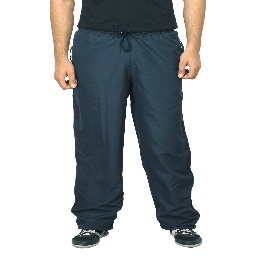
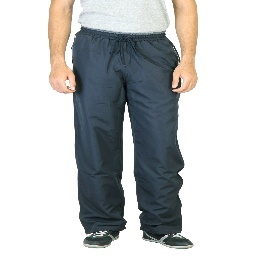
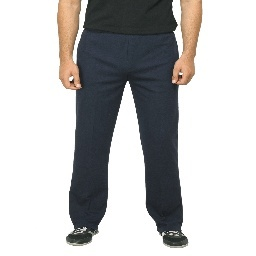
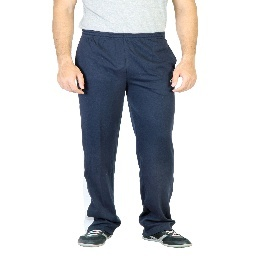
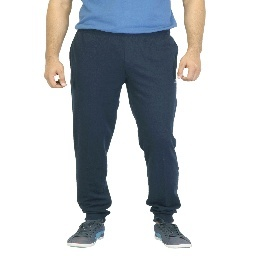
...
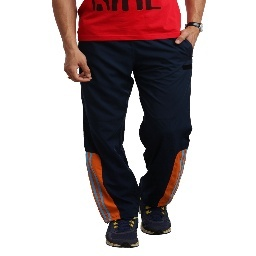
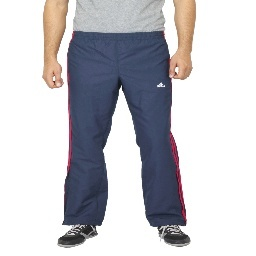
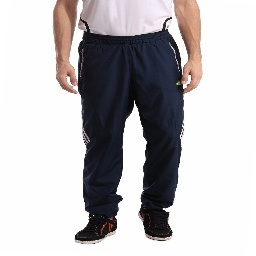
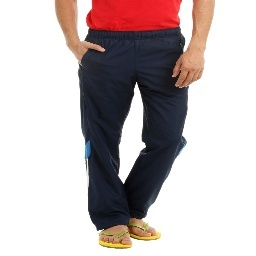
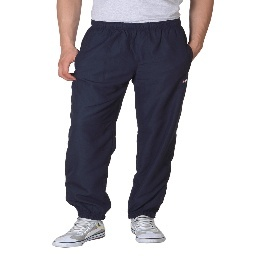

In [140]:
# display the images
display_result(imageids)


## Example 2:

/usr/local/lib/python3.10/dist-packages/qdrant_client/local/distances.py:77: RuntimeWarning: invalid value encountered in divide
  vectors = vectors / np.linalg.norm(vectors, axis=1)[:, np.newaxis]


7991
7959
8002
7979
7986
7992
7987
7999
4029
7988
7997
4095
4100
4557
8000
Absolutely, I'd be happy to help you find the perfect pair of women's sandals. We have a wide variety of options available that are perfect for the upcoming summer season. These sandals are versatile and can be worn for various occasions, from casual outings to more formal events. Here are some options:

- HM Women Black Sandals (Flats)
- HM Women Black Sandals (Heels)
- Enroute Women Black Heels
- Catwalk Women Black Sandals (Heels)
- HM Women Blue Sandals (Flats)
- HM Women White Sandals (Heels)
- HM Women White Sandals (Flats)
- Carlton London Women Classy Black Sandals (Flats)
- Carlton London Women Classy Brown Sandals (Flats)
- Inc. 5 Women Casual Black Sandals (Flats)
- Inc. 5 Women Casual Red Sandals (Flats)
- Carlton London Women Classy Gold Sandals (Flats)
- Rocia Women Black Casual Sandals (Flats)
- Rocia Women Brown & White Sandals (Flats)
- Rocia Women Brown Casual Sandals (Flats)
- ADIDAS Women Sea


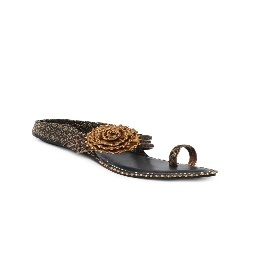
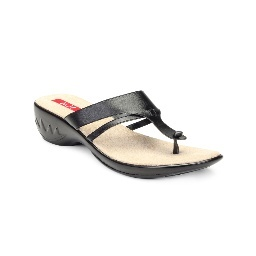
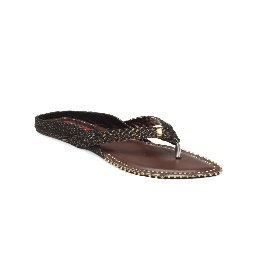
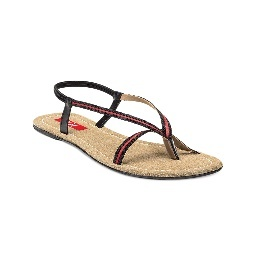
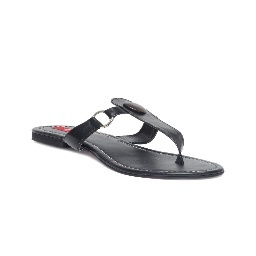
...
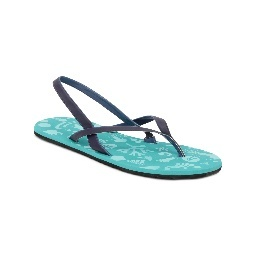
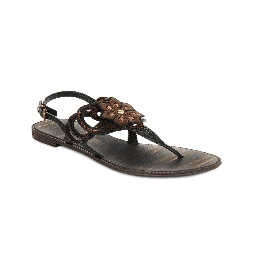
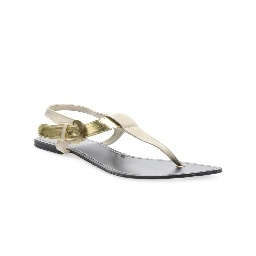
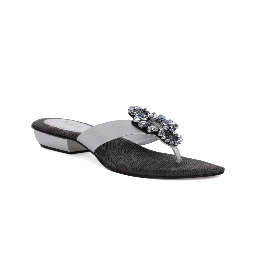
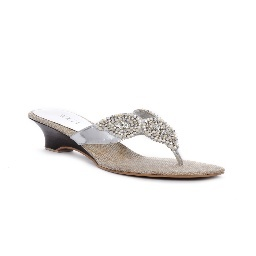

In [141]:
#
question = "Women Sandals"
#
dense_vec = dense_model.encode(question)
#
query_vec, query_tokens = compute_vector(question,query_tokenizer,query_model)
query_indices = query_vec.nonzero().numpy().flatten()
query_values = query_vec.detach().numpy()[query_indices]
#
results = return_results(query_indices,query_values,dense_vec)
#
dense_match = []
sparse_match = []

scores = []
for result in results[0]:
   dense_match.append(result.id)
   scores.append(result.score)
for result in results[1]:
   sparse_match.append(result.id)
   scores.append(result.score)
#
imageids,productids = get_image_ids(dense_match,sparse_match)
#create documents
docs = create_docs(productids,scores)
# Perform Question Answering
response = chain({"input_documents":docs,
                  "question":question},
                 return_only_outputs=True)
#
result = response['output_text']
print(result)

# used returned product ids to get images
display_result(imageids)

## Example 3

/usr/local/lib/python3.10/dist-packages/qdrant_client/local/distances.py:77: RuntimeWarning: invalid value encountered in divide
  vectors = vectors / np.linalg.norm(vectors, axis=1)[:, np.newaxis]


2932
2921
5973
5369
5368
5872
5699
5337
2913
2924
8472
1682
2058
5360
2922
Absolutely, I can help you with that. Here are some of the best men's deodorants we have in our collection:

- Old Spice Men Musk Deodorant: This deodorant has a strong musk fragrance that keeps you fresh all day long.
- 18+ Men Dare Deo: This deodorant is for the daring and adventurous men out there. It has a unique fragrance that sets you apart.
- Rasasi Men Deserve Deo: This deodorant is for the men who believe they deserve the best. It has a long-lasting fragrance that keeps you fresh.
- Lomani Men Desired Deo: This deodorant is for the men who want to be desired. It has a captivating fragrance that attracts attention.
- Boss Men Pure Deo: This deodorant is for the men who like to keep it simple and pure. It has a clean and fresh fragrance.
- Wild stone Men Smoke Deo: This deodorant has a smoky fragrance that is perfect for the men who like to keep it wild and adventurous.
- Gatsby Men Spicy Deo: This deodor


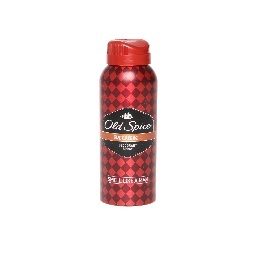
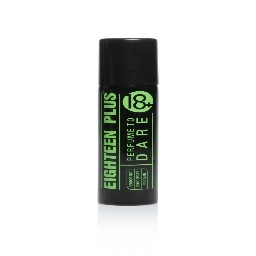
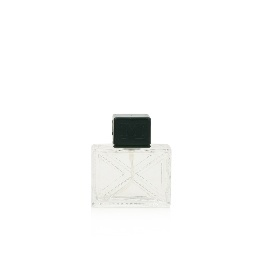
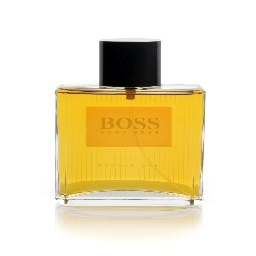
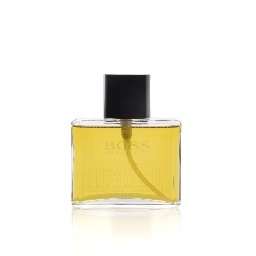
...
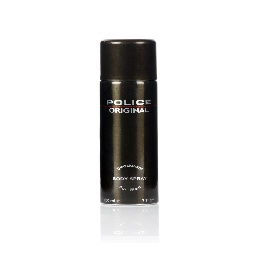
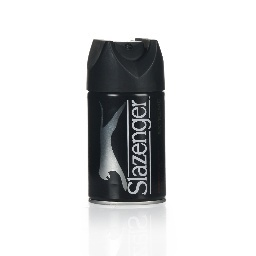
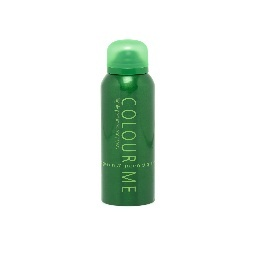
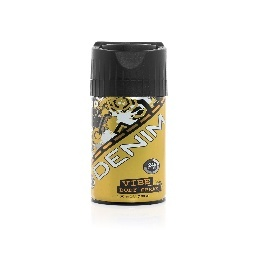
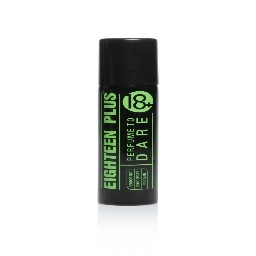

In [144]:
#
question = "Mens deodorant"
#
dense_vec = dense_model.encode(question)
#
query_vec, query_tokens = compute_vector(question,query_tokenizer,query_model)
query_indices = query_vec.nonzero().numpy().flatten()
query_values = query_vec.detach().numpy()[query_indices]
#
results = return_results(query_indices,query_values,dense_vec)
#
dense_match = []
sparse_match = []

scores = []
for result in results[0]:
   dense_match.append(result.id)
   scores.append(result.score)
for result in results[1]:
   sparse_match.append(result.id)
   scores.append(result.score)
#
imageids,productids = get_image_ids(dense_match,sparse_match)
#create documents
docs = create_docs(productids,scores)
# Perform Question Answering
response = chain({"input_documents":docs,
                  "question":question},
                 return_only_outputs=True)
#
result = response['output_text']
print(result)

# used returned product ids to get images
display_result(imageids)

## Example 4:

/usr/local/lib/python3.10/dist-packages/qdrant_client/local/distances.py:77: RuntimeWarning: invalid value encountered in divide
  vectors = vectors / np.linalg.norm(vectors, axis=1)[:, np.newaxis]


5224
5225
580
5798
6447
9068
5794
8681
8695
8686
4091
5867
8011
5227
4892
Absolutely, I have a variety of beautiful dresses for girls. Here are some options:

- "Gini and Jony Kids Girls Solid Pink Dress": A lovely solid pink dress perfect for a casual day out or a party.
- "Doodle Girls Printed Pink Dress": This dress features a fun print, making it a great choice for a playful, casual look.
- "Gini and Jony Girls Printed Pink Dress": A printed pink dress that's perfect for a fun day out.
- "Giny and Jony Girls Printed White & Pink Dress": A beautiful dress with a white and pink print, ideal for a special occasion.
- "Gini and Jony Kids Girls Solid White Dress": A classic solid white dress that can be dressed up or down for any event.
- "Gini and Jony Girls Printed White & Pink Dress": Another lovely printed dress in white and pink, perfect for a party or a day out.
- "Doodle Girls Printed Blue Dress": A vibrant blue printed dress, great for a fun, casual look.
- "Doodle Girls Printed


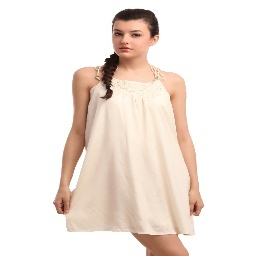
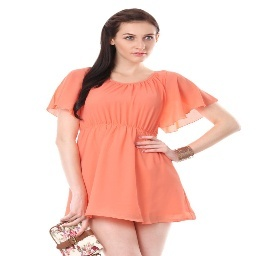
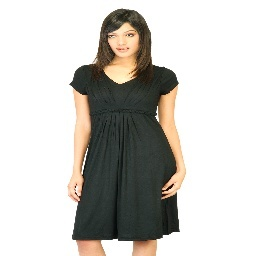
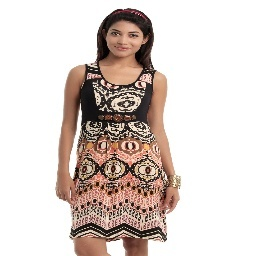
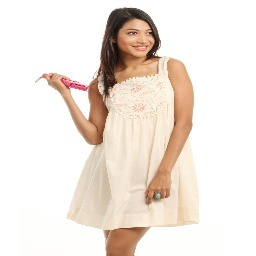
...
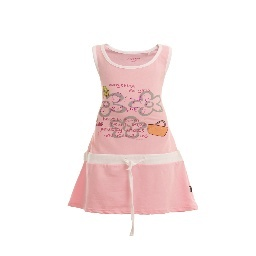
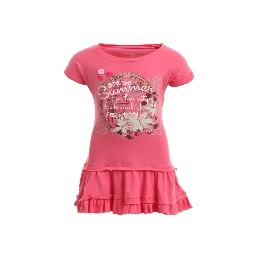
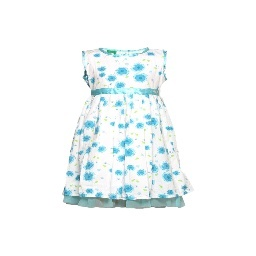
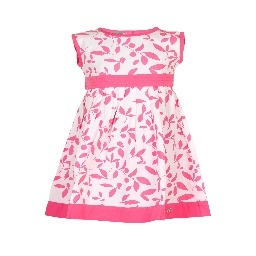
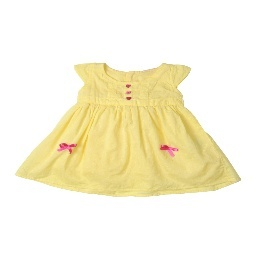

In [145]:
#
question = "girls dresses"
#
dense_vec = dense_model.encode(question)
#
query_vec, query_tokens = compute_vector(question,query_tokenizer,query_model)
query_indices = query_vec.nonzero().numpy().flatten()
query_values = query_vec.detach().numpy()[query_indices]
#
results = return_results(query_indices,query_values,dense_vec)
#
dense_match = []
sparse_match = []

scores = []
for result in results[0]:
   dense_match.append(result.id)
   scores.append(result.score)
for result in results[1]:
   sparse_match.append(result.id)
   scores.append(result.score)
#
imageids,productids = get_image_ids(dense_match,sparse_match)
#create documents
docs = create_docs(productids,scores)
# Perform Question Answering
response = chain({"input_documents":docs,
                  "question":question},
                 return_only_outputs=True)
#
result = response['output_text']
print(result)

# used returned product ids to get images
display_result(imageids)

## Example 5:

/usr/local/lib/python3.10/dist-packages/qdrant_client/local/distances.py:77: RuntimeWarning: invalid value encountered in divide
  vectors = vectors / np.linalg.norm(vectors, axis=1)[:, np.newaxis]


5867
5881
5883
5860
5889
5888
5346
5335
5863
5873
5868
5886
5865
5877
5876
Absolutely, I have a variety of handbags that would be perfect for any occasion. Here are some options:

- Murcia Women Fancy Cream Hand Bag: This is a versatile bag that can be paired with almost any outfit.
- Murcia Women TMK Green Green Handbags: This vibrant green bag is a great way to add a pop of color to your look.
- Fastrack Women Nylon Black Handbag: This durable nylon bag is perfect for everyday use.
- Murcia Women Asjke Green Green Handbags: Another green option, this bag is a bit more subdued but still eye-catching.
- Murcia Women Casual Pink Handbag: This casual bag is great for a relaxed day out.
- Murcia Women Yellow Handbag: This sunny yellow bag is sure to brighten up any outfit.
- Murcia Women Pink Handbag: This bag comes in a lovely shade of pink that's perfect for a feminine look.
- Bulchee Women Black Handbag: This sleek black bag is a classic choice that can be dressed up or down.
- Murcia 


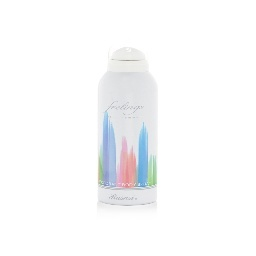
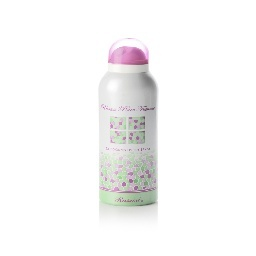
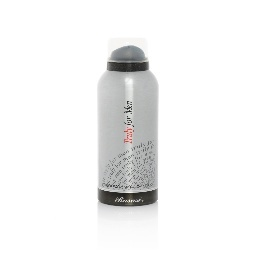
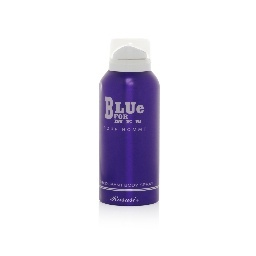
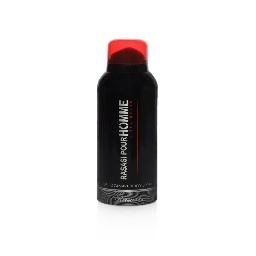
...
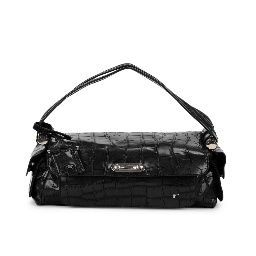
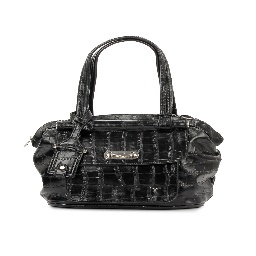
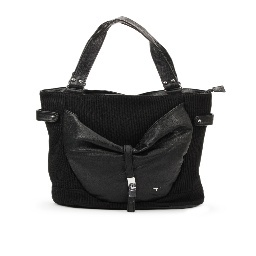
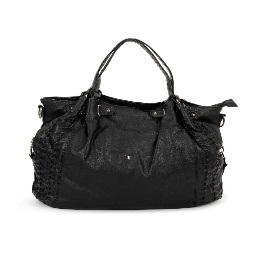
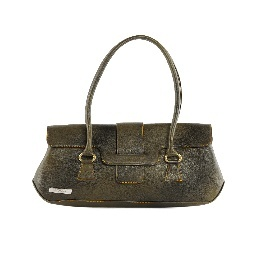

In [146]:
#
question = "handabgs for women"
#
dense_vec = dense_model.encode(question)
#
query_vec, query_tokens = compute_vector(question,query_tokenizer,query_model)
query_indices = query_vec.nonzero().numpy().flatten()
query_values = query_vec.detach().numpy()[query_indices]
#
results = return_results(query_indices,query_values,dense_vec)
#
dense_match = []
sparse_match = []

scores = []
for result in results[0]:
   dense_match.append(result.id)
   scores.append(result.score)
for result in results[1]:
   sparse_match.append(result.id)
   scores.append(result.score)
#
imageids,productids = get_image_ids(dense_match,sparse_match)
#create documents
docs = create_docs(productids,scores)
# Perform Question Answering
response = chain({"input_documents":docs,
                  "question":question},
                 return_only_outputs=True)
#
result = response['output_text']
print(result)

# used returned product ids to get images
display_result(imageids)

In [147]:
docs

[Document(page_content='Product Name:Rasasi Women Feelings Deo;Article Type:Deodorant;', metadata={'pid': '1697', 'score': 0.88160212335425}),
 Document(page_content='Product Name:Rasasi Women Deo;Article Type:Deodorant;', metadata={'pid': '1708', 'score': 0.8491139882325069}),
 Document(page_content='Product Name:Rasasi Men Deo;Article Type:Deodorant;', metadata={'pid': '1727', 'score': 0.8467142992511836}),
 Document(page_content='Product Name:Rasasi Men Deo;Article Type:Deodorant;', metadata={'pid': '1556', 'score': 0.8467142992511836}),
 Document(page_content='Product Name:Rasasi Men Deo;Article Type:Deodorant;', metadata={'pid': '1529', 'score': 0.8467142992511836}),
 Document(page_content='Product Name:Rasasi Men Deo;Article Type:Deodorant;', metadata={'pid': '1600', 'score': 0.8467142992511836}),
 Document(page_content='Product Name:Boss Women Deo;Article Type:Deodorant;', metadata={'pid': '1573', 'score': 0.8425005885350108}),
 Document(page_content='Product Name:HUGO Women XX 

* in the above case the sparse embeddings has returned more appropriate results as evident from the image display and the documents generated


## Example 6 : Search With Images

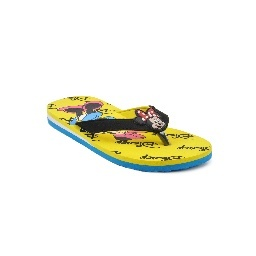

In [148]:
images[100]

In [149]:
product_df.iloc[100]

Pid                                                         2741
articleType                                           Flip Flops
productDisplayName    Disney Unisex Kids Basic Yellow Flip Flops
articleType_label                                              9
Name: 100, dtype: object

In [150]:
#
question = "flip flops"
#
dense_vec = dense_model.encode(images[100])
#
query_vec, query_tokens = compute_vector(question,query_tokenizer,query_model)
query_indices = query_vec.nonzero().numpy().flatten()
query_values = query_vec.detach().numpy()[query_indices]
#
results = return_results(query_indices,query_values,dense_vec)
#
dense_match = []
sparse_match = []

scores = []
for result in results[0]:
   dense_match.append(result.id)
   scores.append(result.score)
for result in results[1]:
   sparse_match.append(result.id)
   scores.append(result.score)
#
imageids,productids = get_image_ids(dense_match,sparse_match)
#create documents
docs = create_docs(productids,scores)
# Perform Question Answering
response = chain({"input_documents":docs,
                  "question":question},
                 return_only_outputs=True)
#
result = response['output_text']
print(result)

/usr/local/lib/python3.10/dist-packages/qdrant_client/local/distances.py:77: RuntimeWarning: invalid value encountered in divide
  vectors = vectors / np.linalg.norm(vectors, axis=1)[:, np.newaxis]


92
4736
100
4735
8755
853
5992
5485
1612
836
855
9154
99
856
4808
Absolutely, flip flops are a fantastic choice for the summer season. They are perfect for casual outings, beach trips, and even everyday wear. Here are some options for you:

- Disney Unisex Kids Mickey Mouse Yellow Flip Flops: Perfect for your little Disney fan, these flip flops are both fun and comfortable.
- Warner Bros Kids Unisex Yellow Flip Flops: Another great option for kids, these flip flops feature a bright yellow color that's perfect for summer.
- Disney Unisex Kids Basic Yellow Flip Flops: A simple and classic design, these flip flops are a great choice for any child.
- Lotto Men's Bavarian Black Yellow Flip Flop: These men's flip flops offer a stylish and comfortable option for any casual outing.
- Jungle Book Boys Red Flip Flops: These Jungle Book-themed flip flops are sure to be a hit with any young boy.
- Lotto Men Green Surf Island Flip Flop: With a cool green color, these flip flops are perfect for a da


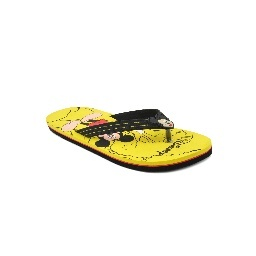
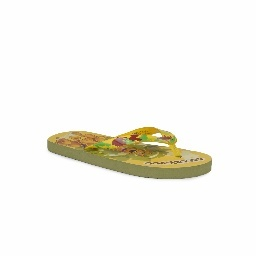
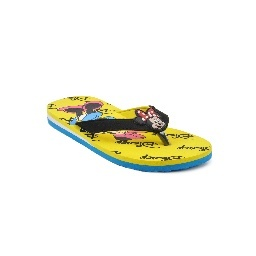
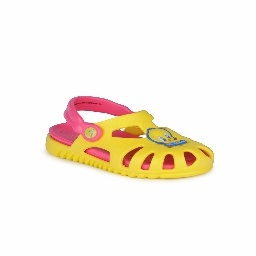
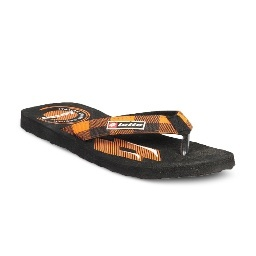
...
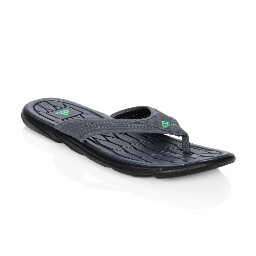
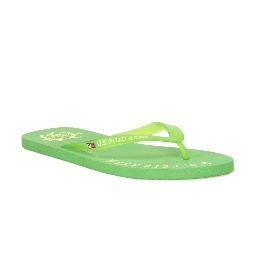
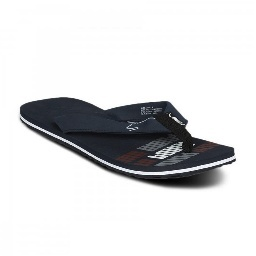
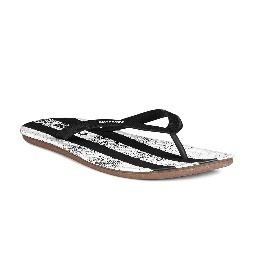
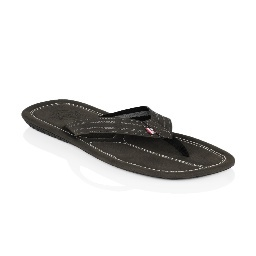

In [151]:
# used returned product ids to get images
display_result(imageids)